In [2]:
from scipy import fftpack
import numpy as np
import cv2
import matplotlib.pyplot as plt
import radialProfile

In [9]:
def fourier(string):
    
    img = cv2.imread(string, 0)
    img = cv2.resize(img, (1000,1000))
        
    F1 = fftpack.fft2(img)
    F2 = fftpack.fftshift( F1 )

    psd2D = np.log10( np.abs( F2 )**2 )
    psd1D = radialProfile.azimuthalAverage(psd2D)
    
    
    plt.figure()
    plt.imshow(img, cmap='gray')
    plt.title('Original Image'), plt.xticks([]), plt.yticks([])

    
    plt.figure()
    plt.imshow(psd2D, cmap = 'gray')
    plt.title('2D Power Spectrum'), plt.xticks([]), plt.yticks([])
    
 
    plt.figure()
    plt.plot(psd1D, '.')
    plt.xlabel('Spatial Frequency')
    plt.ylabel('Power Spectrum')
    plt.title('1D Power Spectrum'), plt.xticks([]), plt.yticks([])

    
    return psd1D, psd2D

In [10]:
def normalise(emote_1D, emote_2D, neutral_1D, neutral_2D):
    emote_normalise_1D = emote_1D - neutral_1D
    emote_normalise_2D = emote_2D - neutral_2D

    plt.figure()
    plt.imshow(emote_normalise_2D, cmap = 'gray')
    plt.title('2D Power Spectrum'), plt.xticks([]), plt.yticks([])
    
 
    plt.figure()
    plt.plot(emote_normalise_1D, '.')
    plt.xlabel('Spatial Frequency')
    plt.ylabel('Power Spectrum')
    plt.title('1D Power Spectrum'), plt.xticks([]), plt.yticks([])

    plt.figure()
    plt.plot(emote_1D)
    plt.legend(['Emotion'])
    
    plt.plot(neutral_1D)
    plt.legend(['Neutral'])
    
    plt.xlabel('Spatial Frequency')
    plt.ylabel('Power Spectrum')
    
    return emote_normalise_1D, emote_normalise_2D

    

In [115]:
x=np.arange(0,len(j_neutral_1D),1) 

def diff(array):
    z= np.polyfit(x,array, 10)
    p= np.poly1d(z)

    idx_small=np.argmin(p(x))  
    idx_big=np.argmax(p(x))

    big=p(x)[idx_big]  
    small=p(x)[idx_small] 

    b=np.abs(big)
    s=np.abs(small)

   # print(b,s)
        
    if b > s:
        #wave=1/idx_big
        #hz=(sp.constants.c)/wave
        idx=idx_big
        
    else:
        
        #wave=1/idx_small
       # hz=(sp.constants.c)/wave
        idx=idx_small
        

    plt.plot(x, p(x))
    
    return idx

'''
hap_idx=diff(hap_array)
sad_idx=diff(sad_array)
ang_idx=diff(ang_array)
sho_idx=diff(sho_array)

print('Biggest difference for Happy at %.0f m^-1'%hap_idx)
print('Biggest difference for Sad at %.0f m^-1'%sad_idx)
print('Biggest difference for Angry at %.0f m^-1'%ang_idx)
print('Biggest difference for Shocked at %.0f m^-1'%sho_idx)


plt.title('Graph showing residual values for 4 different emotions for different spatial frequencies')
plt.xlabel('Spatial Frequency (m^-1)')
plt.ylabel('Residual Value')
plt.legend(['Happy','Sad','Angry','Shocked'])
'''

"\nhap_idx=diff(hap_array)\nsad_idx=diff(sad_array)\nang_idx=diff(ang_array)\nsho_idx=diff(sho_array)\n\nprint('Biggest difference for Happy at %.0f m^-1'%hap_idx)\nprint('Biggest difference for Sad at %.0f m^-1'%sad_idx)\nprint('Biggest difference for Angry at %.0f m^-1'%ang_idx)\nprint('Biggest difference for Shocked at %.0f m^-1'%sho_idx)\n\n\nplt.title('Graph showing residual values for 4 different emotions for different spatial frequencies')\nplt.xlabel('Spatial Frequency (m^-1)')\nplt.ylabel('Residual Value')\nplt.legend(['Happy','Sad','Angry','Shocked'])\n"

# Eoghan:

C:\Users\eoghan\Documents\Jupyter\lib\site-packages\ipykernel_launcher.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  app.launch_new_instance()
C:\Users\eoghan\Documents\Jupyter\lib\site-packages\ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
C:\Users\eoghan\Documents\Jupyter\lib\site-packages\ipykernel_launcher.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume 

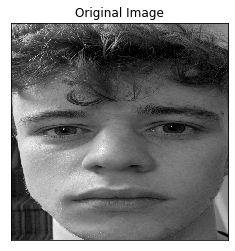

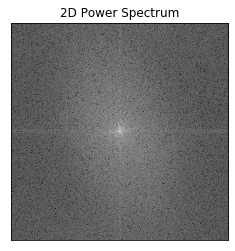

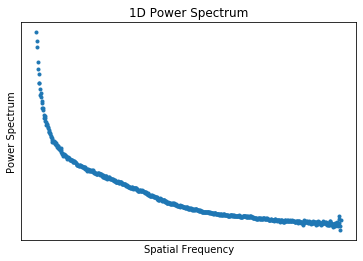

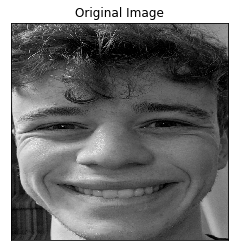

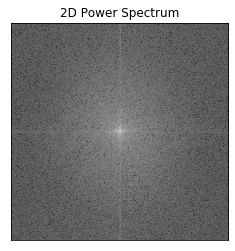

...

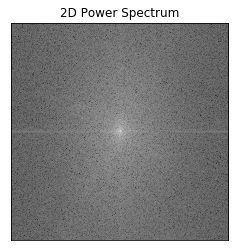

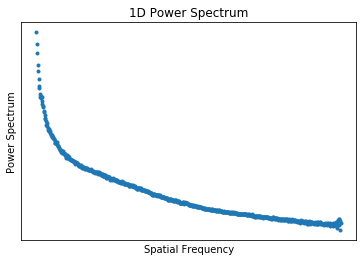

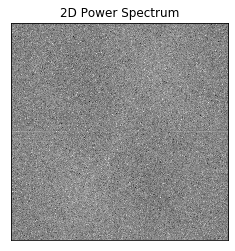

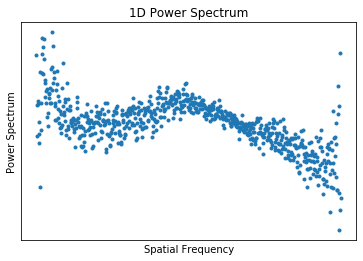

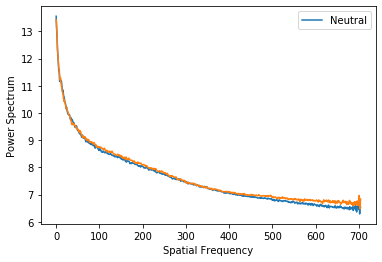

In [109]:
E_neutral_1D, E_neutral_2D = fourier('eo_neutral.jpg')

E_happy_1D, E_happy_2D = fourier('eo_happy.jpg')
eh_norm_1D, eh_norm_2D = normalise(E_happy_1D, E_happy_2D, E_neutral_1D, E_neutral_2D)

E_sad_1D, E_sad_2D = fourier('eo_sad.jpg')
esad_norm_1D, esad_norm_2D = normalise(E_sad_1D, E_sad_2D, E_neutral_1D, E_neutral_2D)

E_angry_1D, E_angry_2D = fourier('eo_angry.jpg')
ea_norm_1D, ea_norm_2D = normalise(E_angry_1D, E_angry_2D, E_neutral_1D, E_neutral_2D)

E_shocked_1D, E_shocked_2D = fourier('eo_shocked.jpg')
es_norm_1D, es_norm_2D = normalise(E_shocked_1D, E_shocked_2D, E_neutral_1D, E_neutral_2D)

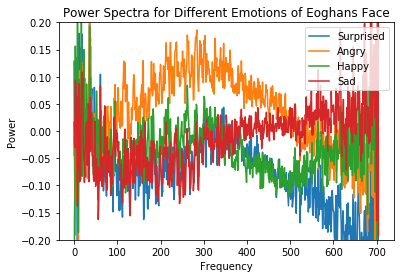

In [111]:
plt.figure()
plt.plot(es_norm_1D, label='Surprised')
plt.plot(ea_norm_1D, label='Angry')
plt.plot(eh_norm_1D, label='Happy')
plt.plot(esad_norm_1D, label='Sad')
plt.legend()
plt.ylim(top=0.2)
plt.ylim(bottom=-0.2)
plt.xlabel('Frequency')
plt.ylabel('Power')

plt.title('Power Spectra for Different Emotions of Eoghans Face')

plt.show()

C:\Users\eoghan\Documents\Jupyter\lib\site-packages\ipykernel_launcher.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  app.launch_new_instance()
C:\Users\eoghan\Documents\Jupyter\lib\site-packages\ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
C:\Users\eoghan\Documents\Jupyter\lib\site-packages\ipykernel_launcher.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume 

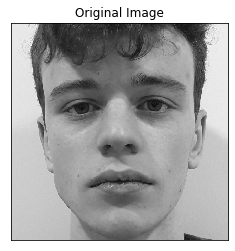

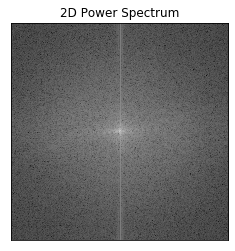

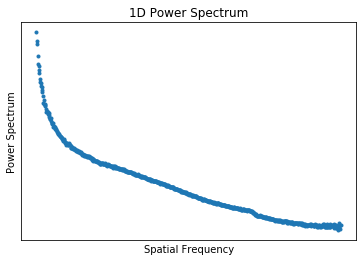

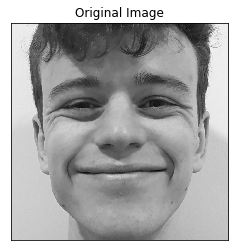

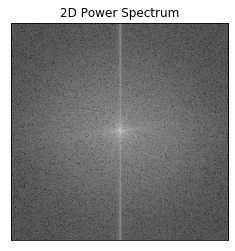

...

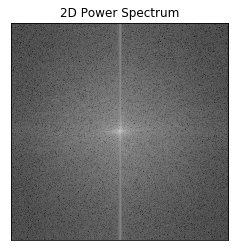

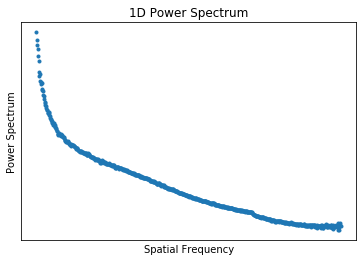

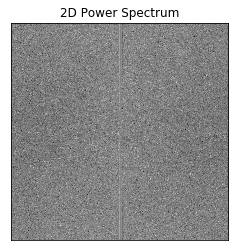

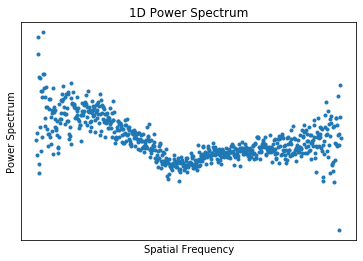

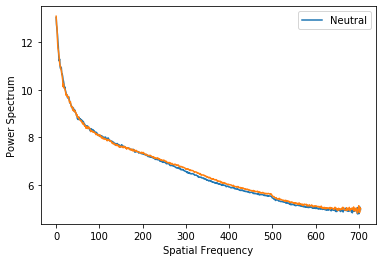

In [143]:
E_neutral_1D, E_neutral_2D = fourier('neut.jpg')

E_happy_1D, E_happy_2D = fourier('happy.jpg')
eh_norm_1D, eh_norm_2D = normalise(E_happy_1D, E_happy_2D, E_neutral_1D, E_neutral_2D)

E_sad_1D, E_sad_2D = fourier('sad.jpg')
esad_norm_1D, esad_norm_2D = normalise(E_sad_1D, E_sad_2D, E_neutral_1D, E_neutral_2D)

E_angry_1D, E_angry_2D = fourier('angry.jpg')
ea_norm_1D, ea_norm_2D = normalise(E_angry_1D, E_angry_2D, E_neutral_1D, E_neutral_2D)

E_shocked_1D, E_shocked_2D = fourier('shocked.jpg')
es_norm_1D, es_norm_2D = normalise(E_shocked_1D, E_shocked_2D, E_neutral_1D, E_neutral_2D)

Biggest difference for Happy at 482 m^-1
Biggest difference for Sad at 309 m^-1
Biggest difference for Angry at 464 m^-1
Biggest difference for Shocked at 339 m^-1


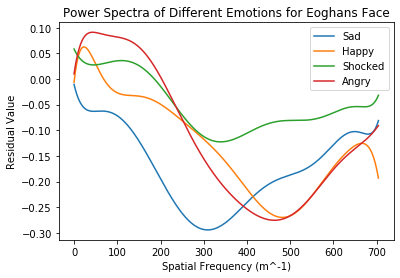

In [144]:

plt.figure()


esad_norm_1D_idx=diff(esad_norm_1D)
eh_norm_1D_idx=diff(eh_norm_1D)
es_norm_1D_idx=diff(es_norm_1D)
ea_norm_1D_idx=diff(ea_norm_1D)

plt.title('Power Spectra of Different Emotions for Eoghans Face')
plt.xlabel('Spatial Frequency (m^-1)')
plt.ylabel('Residual Value')
plt.legend(['Sad','Happy','Shocked','Angry'])

print('Biggest difference for Happy at %.0f m^-1'%eh_norm_1D_idx)
print('Biggest difference for Sad at %.0f m^-1'%esad_norm_1D_idx)
print('Biggest difference for Angry at %.0f m^-1'%ea_norm_1D_idx)
print('Biggest difference for Shocked at %.0f m^-1'%es_norm_1D_idx)



# Jack

C:\Users\eoghan\Documents\Jupyter\lib\site-packages\ipykernel_launcher.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  app.launch_new_instance()
C:\Users\eoghan\Documents\Jupyter\lib\site-packages\ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
C:\Users\eoghan\Documents\Jupyter\lib\site-packages\ipykernel_launcher.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume 

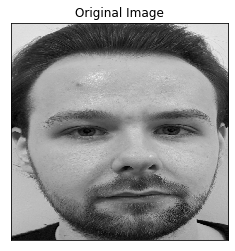

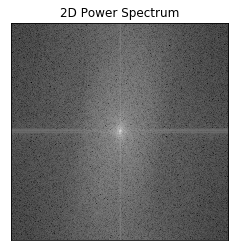

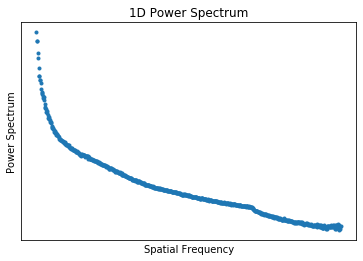

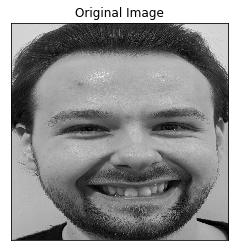

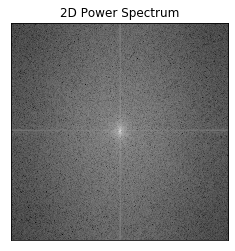

...

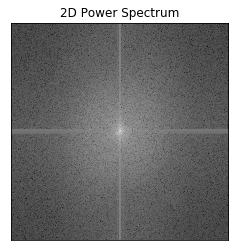

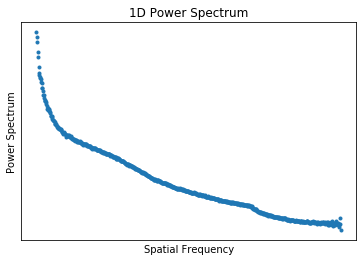

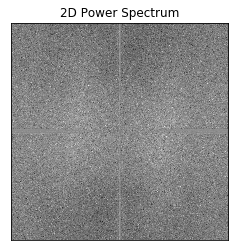

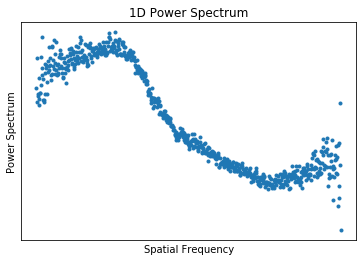

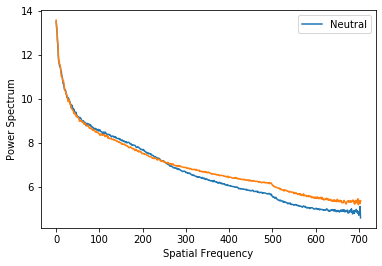

In [145]:
E_neutral_1D, E_neutral_2D = fourier('Jack_neutral.jpg')

E_happy_1D, E_happy_2D = fourier('Jack_happy.jpg')
eh_norm_1D, eh_norm_2D = normalise(E_happy_1D, E_happy_2D, E_neutral_1D, E_neutral_2D)

E_sad_1D, E_sad_2D = fourier('Jack_sad.jpg')
esad_norm_1D, esad_norm_2D = normalise(E_sad_1D, E_sad_2D, E_neutral_1D, E_neutral_2D)

E_angry_1D, E_angry_2D = fourier('Jack_angry.jpg')
ea_norm_1D, ea_norm_2D = normalise(E_angry_1D, E_angry_2D, E_neutral_1D, E_neutral_2D)

E_shocked_1D, E_shocked_2D = fourier('Jack_shocked.jpg')
es_norm_1D, es_norm_2D = normalise(E_shocked_1D, E_shocked_2D, E_neutral_1D, E_neutral_2D)

Biggest difference for Happy at 276 m^-1
Biggest difference for Sad at 237 m^-1
Biggest difference for Angry at 254 m^-1
Biggest difference for Shocked at 556 m^-1


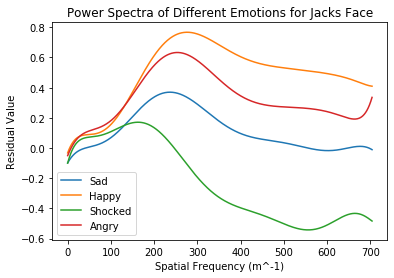

In [146]:

plt.figure()


esad_norm_1D_idx=diff(esad_norm_1D)
eh_norm_1D_idx=diff(eh_norm_1D)
es_norm_1D_idx=diff(es_norm_1D)
ea_norm_1D_idx=diff(ea_norm_1D)

plt.title('Power Spectra of Different Emotions for Jacks Face')
plt.xlabel('Spatial Frequency (m^-1)')
plt.ylabel('Residual Value')
plt.legend(['Sad','Happy','Shocked','Angry'])

print('Biggest difference for Happy at %.0f m^-1'%eh_norm_1D_idx)
print('Biggest difference for Sad at %.0f m^-1'%esad_norm_1D_idx)
print('Biggest difference for Angry at %.0f m^-1'%ea_norm_1D_idx)
print('Biggest difference for Shocked at %.0f m^-1'%es_norm_1D_idx)



# Example 1

C:\Users\eoghan\Documents\Jupyter\lib\site-packages\ipykernel_launcher.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  app.launch_new_instance()
C:\Users\eoghan\Documents\Jupyter\lib\site-packages\ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
C:\Users\eoghan\Documents\Jupyter\lib\site-packages\ipykernel_launcher.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume 

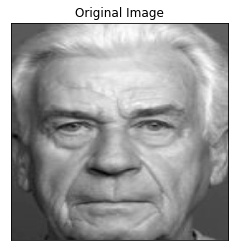

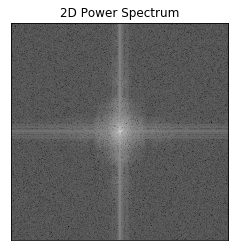

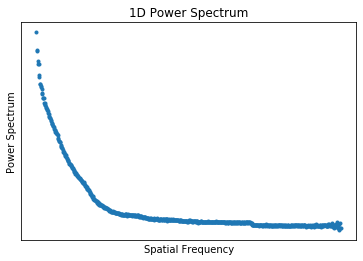

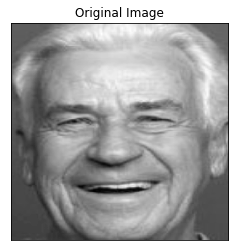

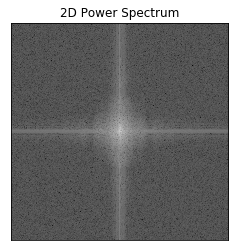

...

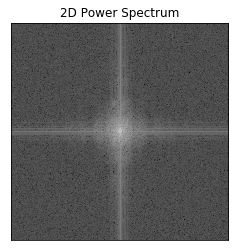

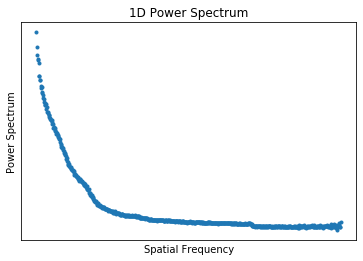

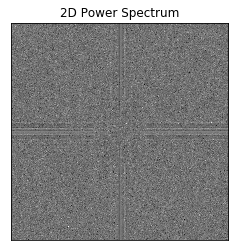

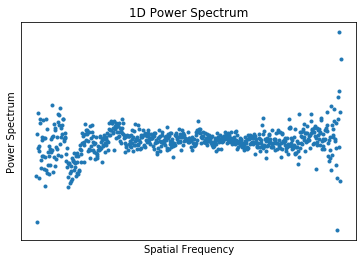

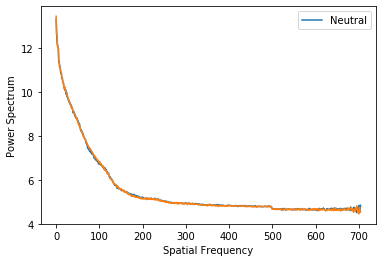

In [137]:
E_neutral_1D, E_neutral_2D = fourier('old_neutral.jpg')

E_happy_1D, E_happy_2D = fourier('old_happy.jpg')
eh_norm_1D, eh_norm_2D = normalise(E_happy_1D, E_happy_2D, E_neutral_1D, E_neutral_2D)

E_sad_1D, E_sad_2D = fourier('old_sad.jpg')
esad_norm_1D, esad_norm_2D = normalise(E_sad_1D, E_sad_2D, E_neutral_1D, E_neutral_2D)

E_angry_1D, E_angry_2D = fourier('old_angry.jpg')
ea_norm_1D, ea_norm_2D = normalise(E_angry_1D, E_angry_2D, E_neutral_1D, E_neutral_2D)

E_shocked_1D, E_shocked_2D = fourier('old_shocked.jpg')
es_norm_1D, es_norm_2D = normalise(E_shocked_1D, E_shocked_2D, E_neutral_1D, E_neutral_2D)

Biggest difference for Happy at 31 m^-1
Biggest difference for Sad at 52 m^-1
Biggest difference for Angry at 103 m^-1
Biggest difference for Shocked at 704 m^-1


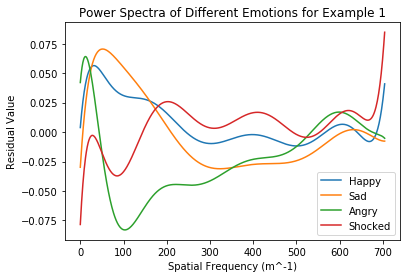

In [138]:

plt.figure()

eh_norm_1D_idx=diff(eh_norm_1D)
esad_norm_1D_idx=diff(esad_norm_1D)
ea_norm_1D_idx=diff(ea_norm_1D)
es_norm_1D_idx=diff(es_norm_1D)

plt.title('Power Spectra of Different Emotions for Example 1')
plt.xlabel('Spatial Frequency (m^-1)')
plt.ylabel('Residual Value')
plt.legend(['Happy','Sad','Angry','Shocked'])

print('Biggest difference for Happy at %.0f m^-1'%eh_norm_1D_idx)
print('Biggest difference for Sad at %.0f m^-1'%esad_norm_1D_idx)
print('Biggest difference for Angry at %.0f m^-1'%ea_norm_1D_idx)
print('Biggest difference for Shocked at %.0f m^-1'%es_norm_1D_idx)



Maximum Happy Distance =  0.2665212146980176
Maximum Sad Distance =  0.28234559359444233


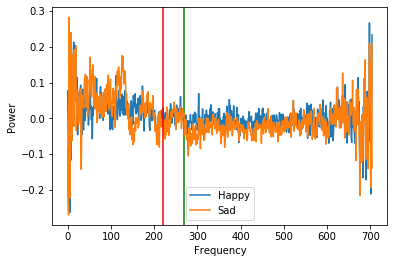

In [54]:
plt.plot(eh_norm_1D, label='Happy')
#plt.axvline(x=270, color='g')
print('Maximum Happy Distance = ', np.max(np.fabs(eh_norm_1D)))

plt.plot(esad_norm_1D, label='Sad')
#plt.axvline(x=220, color='r')
print('Maximum Sad Distance = ', np.max(np.fabs(esad_norm_1D)))
plt.xlabel('Frequency')
plt.ylabel('Power')
plt.legend()
plt.show()

# Example 2

C:\Users\eoghan\Documents\Jupyter\lib\site-packages\ipykernel_launcher.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  app.launch_new_instance()
C:\Users\eoghan\Documents\Jupyter\lib\site-packages\ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
C:\Users\eoghan\Documents\Jupyter\lib\site-packages\ipykernel_launcher.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume 

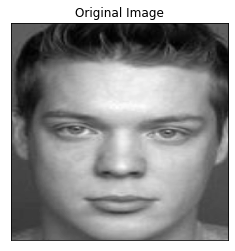

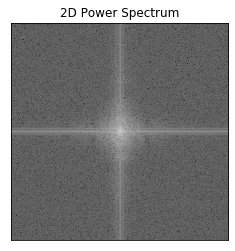

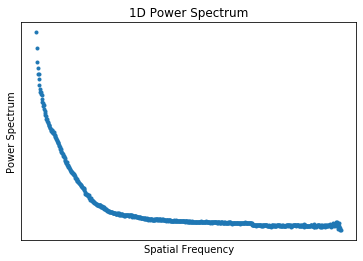

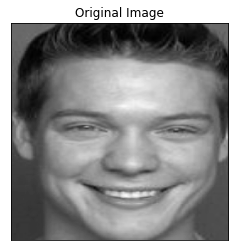

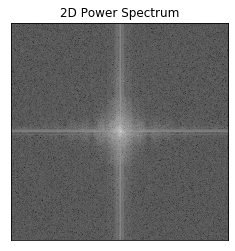

...

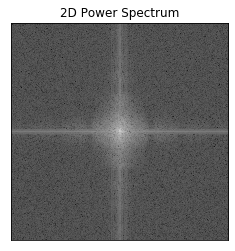

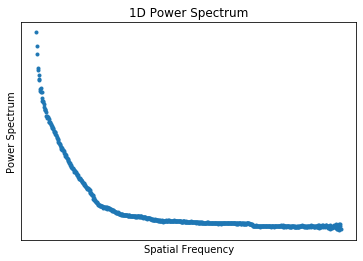

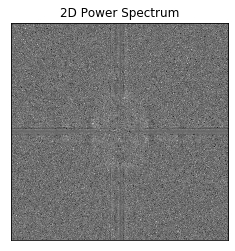

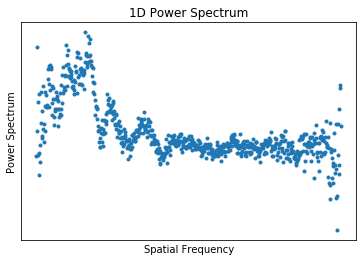

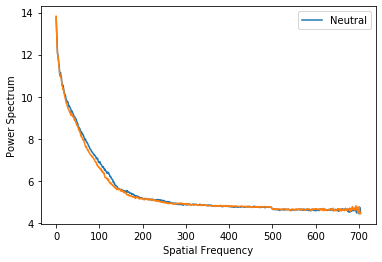

In [135]:
E_neutral_1D, E_neutral_2D = fourier('2_neutral.jpg')

E_happy_1D, E_happy_2D = fourier('2_happy.jpg')
eh_norm_1D, eh_norm_2D = normalise(E_happy_1D, E_happy_2D, E_neutral_1D, E_neutral_2D)

E_sad_1D, E_sad_2D = fourier('2_sad.jpg')
esad_norm_1D, esad_norm_2D = normalise(E_sad_1D, E_sad_2D, E_neutral_1D, E_neutral_2D)

E_angry_1D, E_angry_2D = fourier('2_angry.jpg')
ea_norm_1D, ea_norm_2D = normalise(E_angry_1D, E_angry_2D, E_neutral_1D, E_neutral_2D)

E_shocked_1D, E_shocked_2D = fourier('2_shocked.jpg')
es_norm_1D, es_norm_2D = normalise(E_shocked_1D, E_shocked_2D, E_neutral_1D, E_neutral_2D)

Biggest difference for Happy at 32 m^-1
Biggest difference for Sad at 88 m^-1
Biggest difference for Angry at 704 m^-1
Biggest difference for Shocked at 82 m^-1


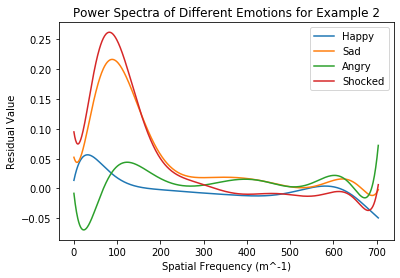

In [136]:


plt.figure()

eh_norm_1D_idx=diff(eh_norm_1D)
esad_norm_1D_idx=diff(esad_norm_1D)
ea_norm_1D_idx=diff(ea_norm_1D)
es_norm_1D_idx=diff(es_norm_1D)

plt.title('Power Spectra of Different Emotions for Example 2')
plt.xlabel('Spatial Frequency (m^-1)')
plt.ylabel('Residual Value')
plt.legend(['Happy','Sad','Angry','Shocked'])

print('Biggest difference for Happy at %.0f m^-1'%eh_norm_1D_idx)
print('Biggest difference for Sad at %.0f m^-1'%esad_norm_1D_idx)
print('Biggest difference for Angry at %.0f m^-1'%ea_norm_1D_idx)
print('Biggest difference for Shocked at %.0f m^-1'%es_norm_1D_idx)



Maximum Happy Distance =  0.32663604339274244
Maximum Sad Distance =  0.3416934083583385


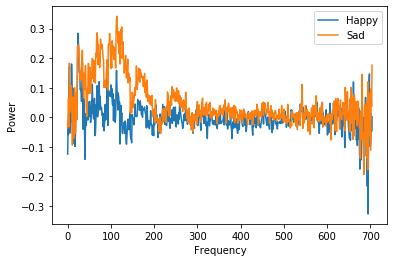

In [61]:
plt.plot(eh_norm_1D, label='Happy')
#plt.axvline(x=270, color='g')
print('Maximum Happy Distance = ', np.max(np.fabs(eh_norm_1D)))

plt.plot(esad_norm_1D, label='Sad')
#plt.axvline(x=220, color='r')
print('Maximum Sad Distance = ', np.max(np.fabs(esad_norm_1D)))
plt.xlabel('Frequency')
plt.ylabel('Power')
plt.legend()
plt.show()

# Example 3

C:\Users\eoghan\Documents\Jupyter\lib\site-packages\ipykernel_launcher.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  app.launch_new_instance()
C:\Users\eoghan\Documents\Jupyter\lib\site-packages\ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
C:\Users\eoghan\Documents\Jupyter\lib\site-packages\ipykernel_launcher.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume 

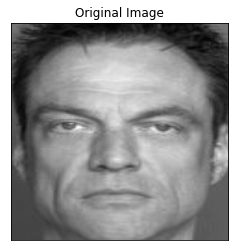

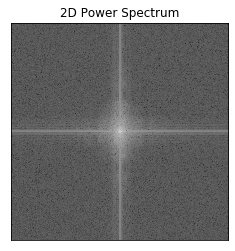

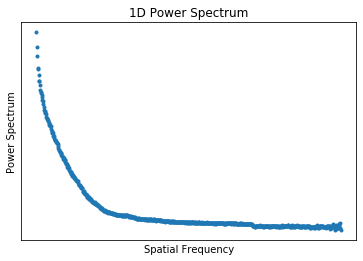

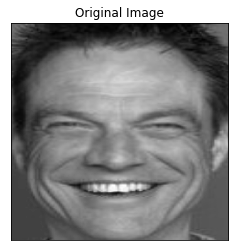

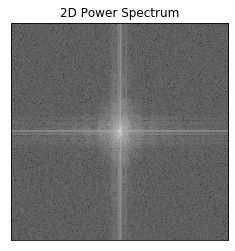

...

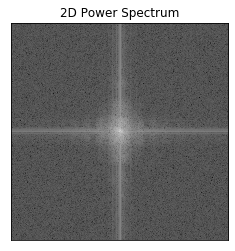

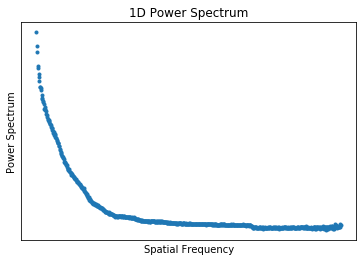

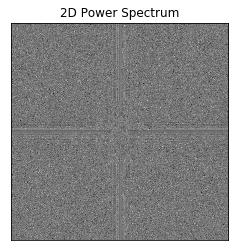

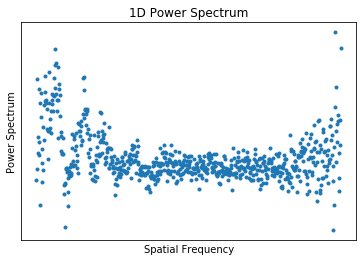

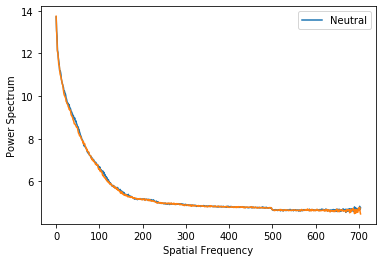

In [131]:
E_neutral_1D, E_neutral_2D = fourier('3_neutral.jpg')

E_happy_1D, E_happy_2D = fourier('3_happy.jpg')
eh_norm_1D, eh_norm_2D = normalise(E_happy_1D, E_happy_2D, E_neutral_1D, E_neutral_2D)

E_sad_1D, E_sad_2D = fourier('3_sad.jpg')
esad_norm_1D, esad_norm_2D = normalise(E_sad_1D, E_sad_2D, E_neutral_1D, E_neutral_2D)

E_angry_1D, E_angry_2D = fourier('3_angry.jpg')
ea_norm_1D, ea_norm_2D = normalise(E_angry_1D, E_angry_2D, E_neutral_1D, E_neutral_2D)

E_shocked_1D, E_shocked_2D = fourier('3_shocked.jpg')
es_norm_1D, es_norm_2D = normalise(E_shocked_1D, E_shocked_2D, E_neutral_1D, E_neutral_2D)

Biggest difference for Happy at 89 m^-1
Biggest difference for Sad at 46 m^-1
Biggest difference for Angry at 99 m^-1
Biggest difference for Shocked at 26 m^-1


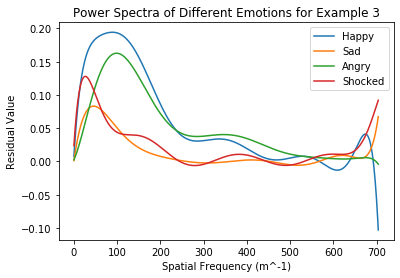

In [133]:

plt.figure()

eh_norm_1D_idx=diff(eh_norm_1D)
esad_norm_1D_idx=diff(esad_norm_1D)
ea_norm_1D_idx=diff(ea_norm_1D)
es_norm_1D_idx=diff(es_norm_1D)

plt.title('Power Spectra of Different Emotions for Example 3')
plt.xlabel('Spatial Frequency (m^-1)')
plt.ylabel('Residual Value')
plt.legend(['Happy','Sad','Angry','Shocked'])

print('Biggest difference for Happy at %.0f m^-1'%eh_norm_1D_idx)
print('Biggest difference for Sad at %.0f m^-1'%esad_norm_1D_idx)
print('Biggest difference for Angry at %.0f m^-1'%ea_norm_1D_idx)
print('Biggest difference for Shocked at %.0f m^-1'%es_norm_1D_idx)



Maximum Happy Distance =  0.3037259099432692
Maximum Sad Distance =  0.35189299987229905


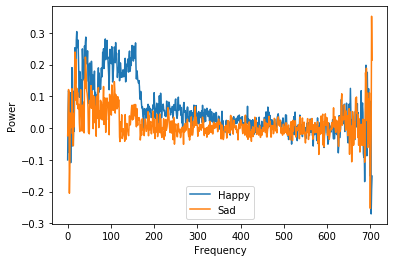

In [86]:
plt.plot(eh_norm_1D, label='Happy')
#plt.axvline(x=270, color='g')
print('Maximum Happy Distance = ', np.max(np.fabs(eh_norm_1D)))

plt.plot(esad_norm_1D, label='Sad')
#plt.axvline(x=220, color='r')
print('Maximum Sad Distance = ', np.max(np.fabs(esad_norm_1D)))
plt.xlabel('Frequency')
plt.ylabel('Power')
plt.legend()
plt.show()

# Jack Mouth and Eye

C:\Users\eoghan\Documents\Jupyter\lib\site-packages\ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\eoghan\Documents\Jupyter\lib\site-packages\ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """
C:\Users\eoghan\Documents\Jupyter\lib\site-packages\ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning

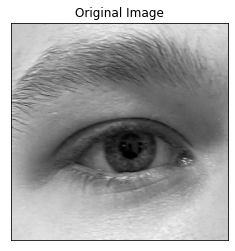

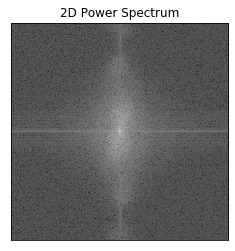

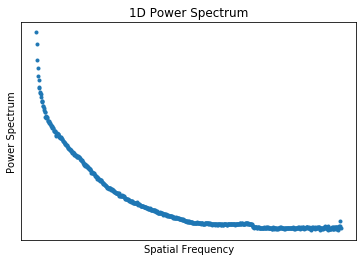

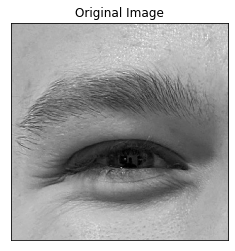

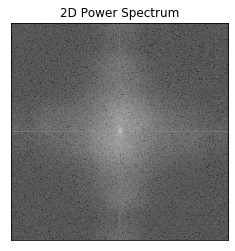

...

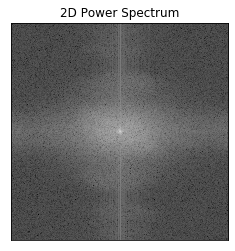

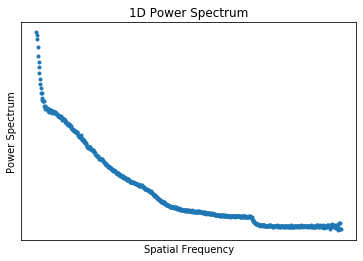

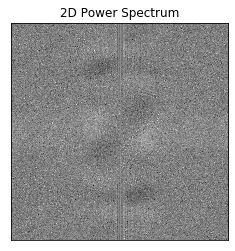

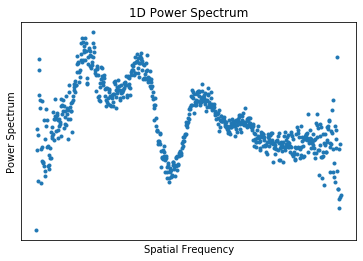

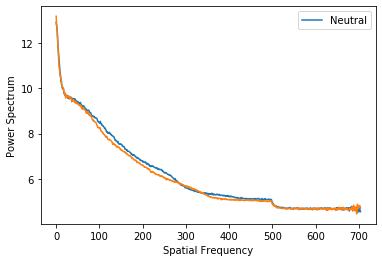

In [87]:
eye_neutral_1D, eye_neutral_2D = fourier('Jack_neutral_eye.jpg')

eye_happy_1D, eye_happy_2D = fourier('Jack_happy_eye.jpg')
eyeh_norm_1D, eyeh_norm_2D = normalise(eye_happy_1D, eye_happy_2D, eye_neutral_1D, eye_neutral_2D)

eye_sad_1D, eye_sad_2D = fourier('Jack_sad_eye.jpg')
eyesad_norm_1D, eyesad_norm_2D = normalise(eye_sad_1D, eye_sad_2D, eye_neutral_1D, eye_neutral_2D)


mouth_neutral_1D, mouth_neutral_2D = fourier('Jack_neutral_mouth.jpg')

mouth_happy_1D, mouth_happy_2D = fourier('Jack_happy_mouth.jpg')
mh_norm_1D, mh_norm_2D = normalise(mouth_happy_1D, mouth_happy_2D, mouth_neutral_1D, mouth_neutral_2D)

mouth_sad_1D, mouth_sad_2D = fourier('Jack_sad_mouth.jpg')
msad_norm_1D, msad_norm_2D = normalise(mouth_sad_1D, mouth_sad_2D, mouth_neutral_1D, mouth_neutral_2D)


Maximum Happy Distance =  0.3037259099432692
Maximum Sad Distance =  0.35189299987229905


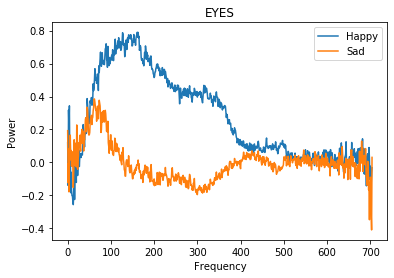

Maximum Happy Distance =  0.3037259099432692
Maximum Sad Distance =  0.35189299987229905


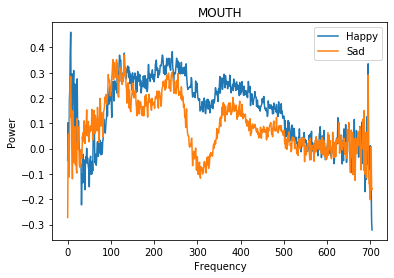

In [88]:

plt.figure()
plt.title('EYES')
plt.plot(eyeh_norm_1D, label='Happy')
#plt.axvline(x=270, color='g')
print('Maximum Happy Distance = ', np.max(np.fabs(eh_norm_1D)))

plt.plot(eyesad_norm_1D, label='Sad')
#plt.axvline(x=220, color='r')
print('Maximum Sad Distance = ', np.max(np.fabs(esad_norm_1D)))
plt.xlabel('Frequency')
plt.ylabel('Power')
plt.legend()
plt.show()


plt.figure()
plt.title('MOUTH')
plt.plot(mh_norm_1D, label='Happy')
#plt.axvline(x=270, color='g')
print('Maximum Happy Distance = ', np.max(np.fabs(eh_norm_1D)))

plt.plot(msad_norm_1D, label='Sad')
#plt.axvline(x=220, color='r')
print('Maximum Sad Distance = ', np.max(np.fabs(esad_norm_1D)))
plt.xlabel('Frequency')
plt.ylabel('Power')
plt.legend()
plt.show()

# Example 1 Mouth and Eyes

C:\Users\eoghan\Documents\Jupyter\lib\site-packages\ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\eoghan\Documents\Jupyter\lib\site-packages\ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """
C:\Users\eoghan\Documents\Jupyter\lib\site-packages\ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning

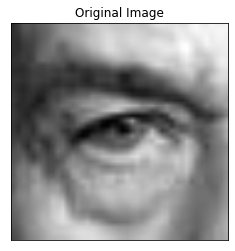

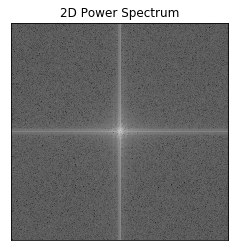

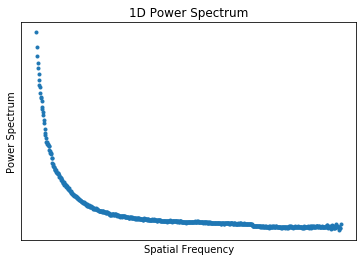

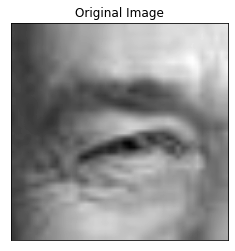

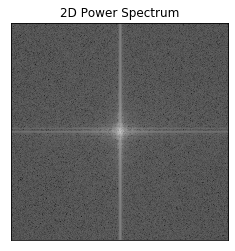

...

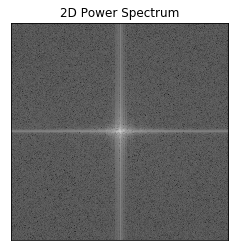

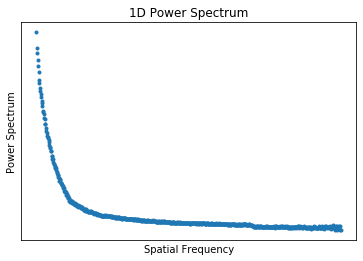

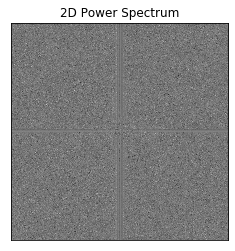

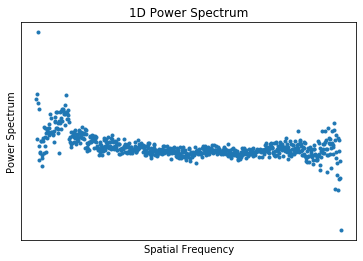

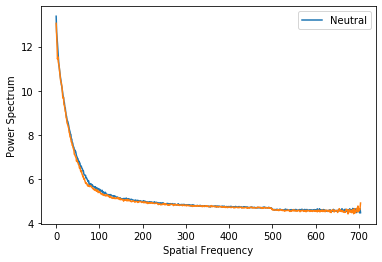

In [70]:
eye_neutral_1D, eye_neutral_2D = fourier('old_neutral_eye.jpg')

eye_happy_1D, eye_happy_2D = fourier('old_happy_eye.jpg')
eyeh_norm_1D, eyeh_norm_2D = normalise(eye_happy_1D, eye_happy_2D, eye_neutral_1D, eye_neutral_2D)

eye_sad_1D, eye_sad_2D = fourier('old_sad_eye.jpg')
eyesad_norm_1D, eyesad_norm_2D = normalise(eye_sad_1D, eye_sad_2D, eye_neutral_1D, eye_neutral_2D)


mouth_neutral_1D, mouth_neutral_2D = fourier('old_neutral_mouth.jpg')

mouth_happy_1D, mouth_happy_2D = fourier('old_happy_mouth.jpg')
mh_norm_1D, mh_norm_2D = normalise(mouth_happy_1D, mouth_happy_2D, mouth_neutral_1D, mouth_neutral_2D)

mouth_sad_1D, mouth_sad_2D = fourier('old_sad_mouth.jpg')
msad_norm_1D, msad_norm_2D = normalise(mouth_sad_1D, mouth_sad_2D, mouth_neutral_1D, mouth_neutral_2D)


Maximum Happy Distance =  0.3037259099432692
Maximum Sad Distance =  0.35189299987229905


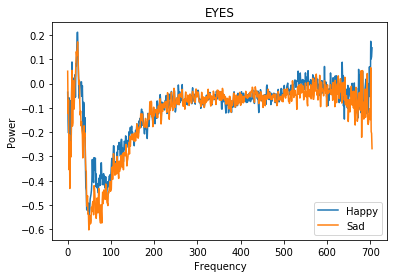

Maximum Happy Distance =  0.3037259099432692
Maximum Sad Distance =  0.35189299987229905


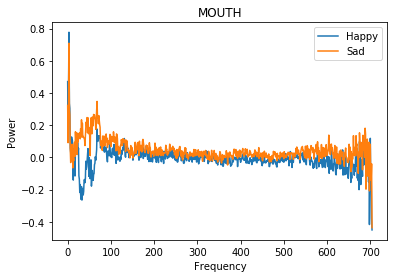

In [71]:

plt.figure()
plt.title('EYES')
plt.plot(eyeh_norm_1D, label='Happy')
#plt.axvline(x=270, color='g')
print('Maximum Happy Distance = ', np.max(np.fabs(eh_norm_1D)))

plt.plot(eyesad_norm_1D, label='Sad')
#plt.axvline(x=220, color='r')
print('Maximum Sad Distance = ', np.max(np.fabs(esad_norm_1D)))
plt.xlabel('Frequency')
plt.ylabel('Power')
plt.legend()
plt.show()


plt.figure()
plt.title('MOUTH')
plt.plot(mh_norm_1D, label='Happy')
#plt.axvline(x=270, color='g')
print('Maximum Happy Distance = ', np.max(np.fabs(eh_norm_1D)))

plt.plot(msad_norm_1D, label='Sad')
#plt.axvline(x=220, color='r')
print('Maximum Sad Distance = ', np.max(np.fabs(esad_norm_1D)))
plt.xlabel('Frequency')
plt.ylabel('Power')
plt.legend()
plt.show()

# Example 2 Mouth and Eyes

C:\Users\eoghan\Documents\Jupyter\lib\site-packages\ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\eoghan\Documents\Jupyter\lib\site-packages\ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """
C:\Users\eoghan\Documents\Jupyter\lib\site-packages\ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning

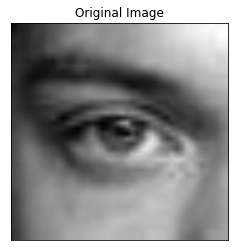

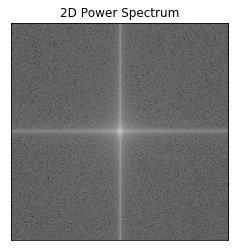

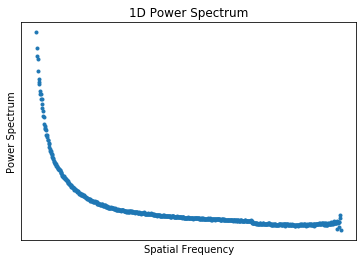

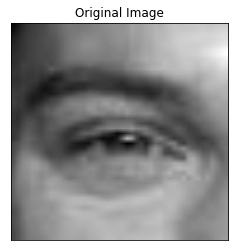

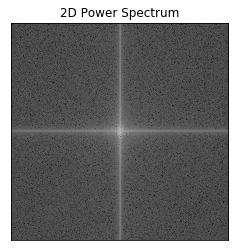

...

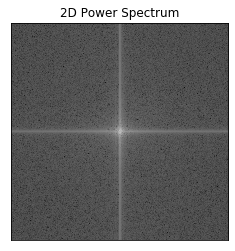

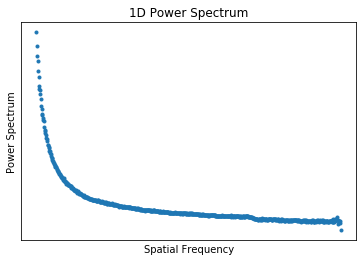

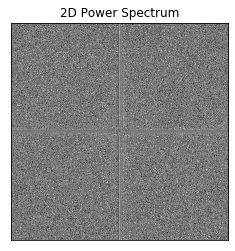

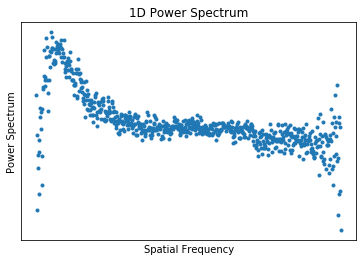

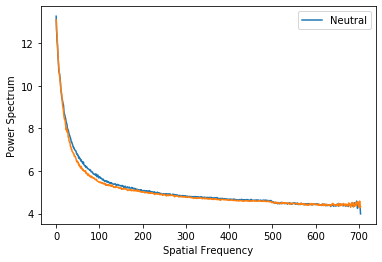

In [73]:
eye_neutral_1D, eye_neutral_2D = fourier('2_neutral_eye.jpg')

eye_happy_1D, eye_happy_2D = fourier('2_happy_eye.jpg')
eyeh_norm_1D, eyeh_norm_2D = normalise(eye_happy_1D, eye_happy_2D, eye_neutral_1D, eye_neutral_2D)

eye_sad_1D, eye_sad_2D = fourier('2_sad_eye.jpg')
eyesad_norm_1D, eyesad_norm_2D = normalise(eye_sad_1D, eye_sad_2D, eye_neutral_1D, eye_neutral_2D)


mouth_neutral_1D, mouth_neutral_2D = fourier('2_neutral_mouth.jpg')

mouth_happy_1D, mouth_happy_2D = fourier('2_happy_mouth.jpg')
mh_norm_1D, mh_norm_2D = normalise(mouth_happy_1D, mouth_happy_2D, mouth_neutral_1D, mouth_neutral_2D)

mouth_sad_1D, mouth_sad_2D = fourier('2_sad_mouth.jpg')
msad_norm_1D, msad_norm_2D = normalise(mouth_sad_1D, mouth_sad_2D, mouth_neutral_1D, mouth_neutral_2D)


Maximum Happy Distance =  0.3037259099432692
Maximum Sad Distance =  0.35189299987229905


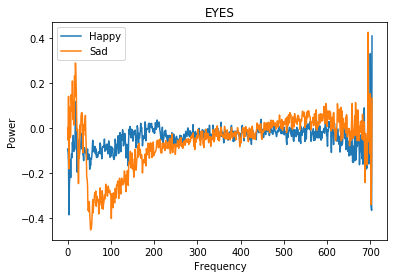

Maximum Happy Distance =  0.3037259099432692
Maximum Sad Distance =  0.35189299987229905


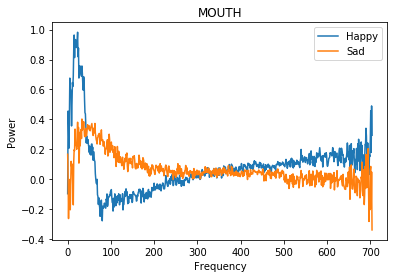

In [74]:

plt.figure()
plt.title('EYES')
plt.plot(eyeh_norm_1D, label='Happy')
#plt.axvline(x=270, color='g')
print('Maximum Happy Distance = ', np.max(np.fabs(eh_norm_1D)))

plt.plot(eyesad_norm_1D, label='Sad')
#plt.axvline(x=220, color='r')
print('Maximum Sad Distance = ', np.max(np.fabs(esad_norm_1D)))
plt.xlabel('Frequency')
plt.ylabel('Power')
plt.legend()
plt.show()


plt.figure()
plt.title('MOUTH')
plt.plot(mh_norm_1D, label='Happy')
#plt.axvline(x=270, color='g')
print('Maximum Happy Distance = ', np.max(np.fabs(eh_norm_1D)))

plt.plot(msad_norm_1D, label='Sad')
#plt.axvline(x=220, color='r')
print('Maximum Sad Distance = ', np.max(np.fabs(esad_norm_1D)))
plt.xlabel('Frequency')
plt.ylabel('Power')
plt.legend()
plt.show()

# Example 3 Mouth and Eyes

C:\Users\eoghan\Documents\Jupyter\lib\site-packages\ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\eoghan\Documents\Jupyter\lib\site-packages\ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """
C:\Users\eoghan\Documents\Jupyter\lib\site-packages\ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning

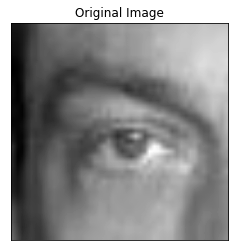

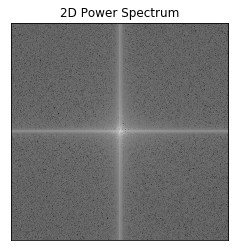

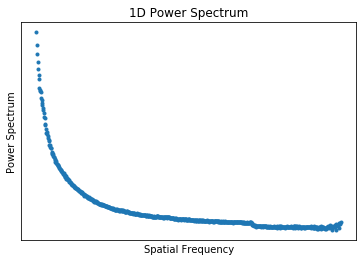

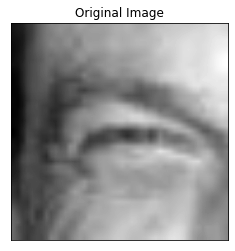

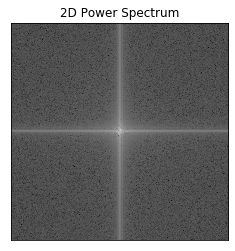

...

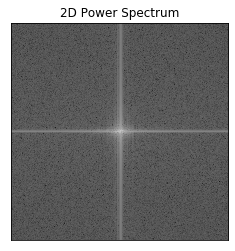

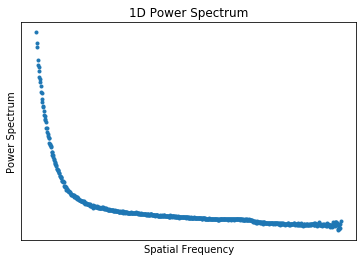

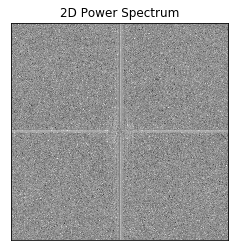

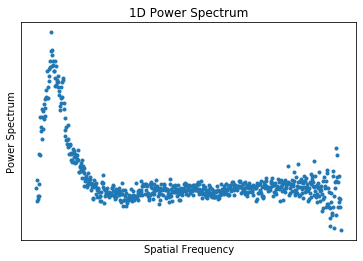

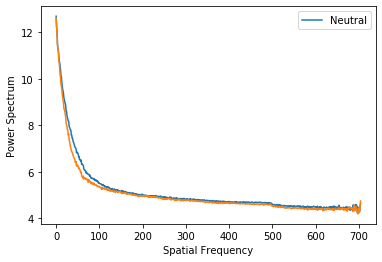

In [75]:
eye_neutral_1D, eye_neutral_2D = fourier('3_neutral_eye.jpg')

eye_happy_1D, eye_happy_2D = fourier('3_happy_eye.jpg')
eyeh_norm_1D, eyeh_norm_2D = normalise(eye_happy_1D, eye_happy_2D, eye_neutral_1D, eye_neutral_2D)

eye_sad_1D, eye_sad_2D = fourier('3_sad_eye.jpg')
eyesad_norm_1D, eyesad_norm_2D = normalise(eye_sad_1D, eye_sad_2D, eye_neutral_1D, eye_neutral_2D)


mouth_neutral_1D, mouth_neutral_2D = fourier('3_neutral_mouth.jpg')

mouth_happy_1D, mouth_happy_2D = fourier('3_happy_mouth.jpg')
mh_norm_1D, mh_norm_2D = normalise(mouth_happy_1D, mouth_happy_2D, mouth_neutral_1D, mouth_neutral_2D)

mouth_sad_1D, mouth_sad_2D = fourier('3_sad_mouth.jpg')
msad_norm_1D, msad_norm_2D = normalise(mouth_sad_1D, mouth_sad_2D, mouth_neutral_1D, mouth_neutral_2D)


Maximum Happy Distance =  0.3037259099432692
Maximum Sad Distance =  0.35189299987229905


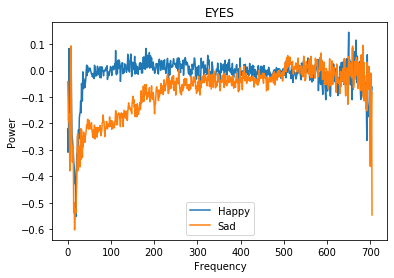

Maximum Happy Distance =  0.3037259099432692
Maximum Sad Distance =  0.35189299987229905


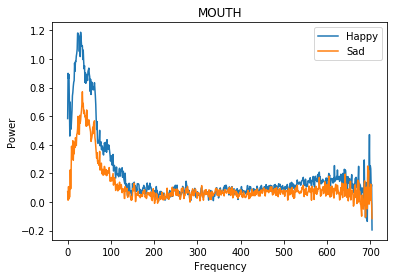

In [76]:

plt.figure()
plt.title('EYES')
plt.plot(eyeh_norm_1D, label='Happy')
#plt.axvline(x=270, color='g')
print('Maximum Happy Distance = ', np.max(np.fabs(eh_norm_1D)))

plt.plot(eyesad_norm_1D, label='Sad')
#plt.axvline(x=220, color='r')
print('Maximum Sad Distance = ', np.max(np.fabs(esad_norm_1D)))
plt.xlabel('Frequency')
plt.ylabel('Power')
plt.legend()
plt.show()


plt.figure()
plt.title('MOUTH')
plt.plot(mh_norm_1D, label='Happy')
#plt.axvline(x=270, color='g')
print('Maximum Happy Distance = ', np.max(np.fabs(eh_norm_1D)))

plt.plot(msad_norm_1D, label='Sad')
#plt.axvline(x=220, color='r')
print('Maximum Sad Distance = ', np.max(np.fabs(esad_norm_1D)))
plt.xlabel('Frequency')
plt.ylabel('Power')
plt.legend()
plt.show()

# My mouth

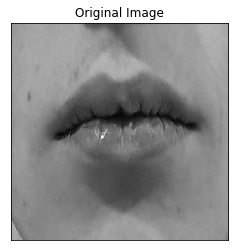

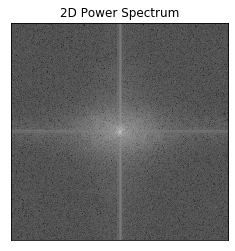

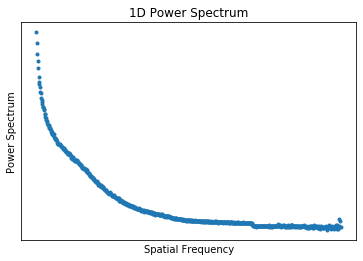

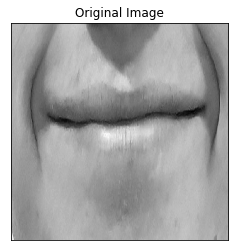

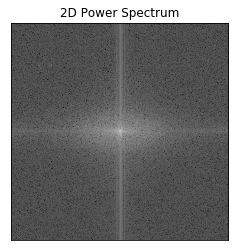

...

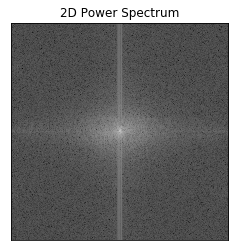

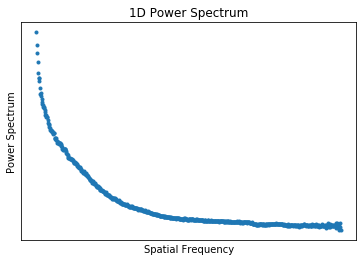

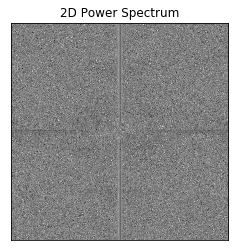

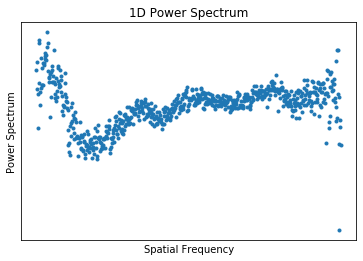

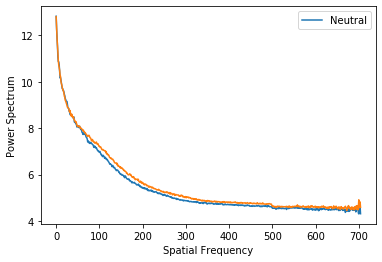

In [106]:

mouth_neutral_1D, mouth_neutral_2D = fourier('neut_mouth.jpg')

mouth_happy_1D, mouth_happy_2D = fourier('happy_mouth.jpg')
mh_norm_1D, mh_norm_2D = normalise(mouth_happy_1D, mouth_happy_2D, mouth_neutral_1D, mouth_neutral_2D)

mouth_sad_1D, mouth_sad_2D = fourier('sad_mouth.jpg')
msad_norm_1D, msad_norm_2D = normalise(mouth_sad_1D, mouth_sad_2D, mouth_neutral_1D, mouth_neutral_2D)


Maximum Happy Distance =  0.43855005147634074
Maximum Sad Distance =  0.34942171574623515


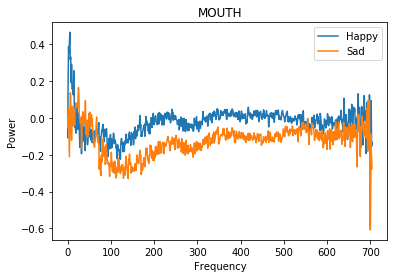

In [107]:


plt.figure()
plt.title('MOUTH')
plt.plot(mh_norm_1D, label='Happy')
#plt.axvline(x=270, color='g')
print('Maximum Happy Distance = ', np.max(np.fabs(eh_norm_1D)))

plt.plot(msad_norm_1D, label='Sad')
#plt.axvline(x=220, color='r')
print('Maximum Sad Distance = ', np.max(np.fabs(esad_norm_1D)))
plt.xlabel('Frequency')
plt.ylabel('Power')
plt.legend()
plt.show()